In [1]:
from google.colab import drive
drive.mount("/content/gdrive", force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [2]:
import matplotlib.pyplot as plt
import numpy as np

import keras
from keras.layers import Activation, BatchNormalization, Dense, Dropout, Flatten, Input, Reshape, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, UpSampling2D
from keras.models import Model, Sequential
from keras.optimizers import Adam

Using TensorFlow backend.


In [3]:
data = np.load('/content/gdrive/My Drive/Project/slt10_car.npy')

print(data.shape)

(800, 96, 96, 3)


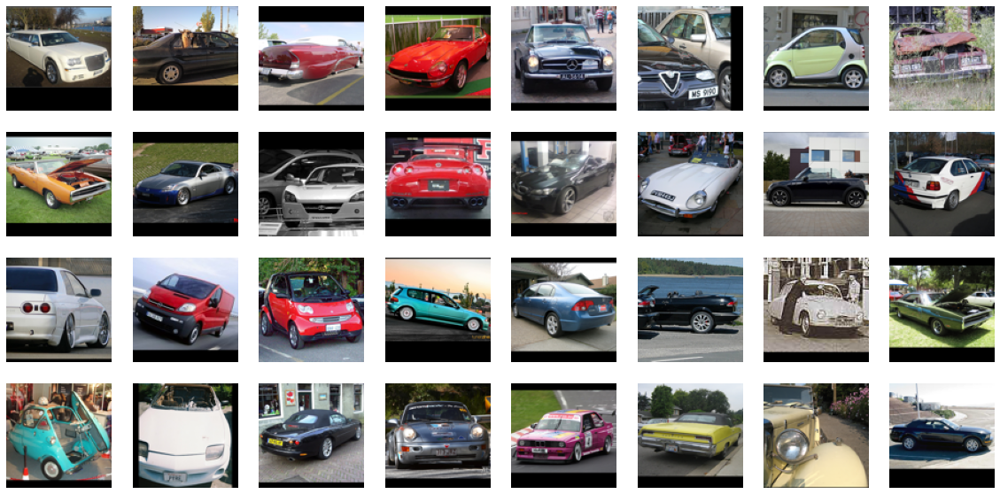

In [4]:
sample = data[:32]
_, ax = plt.subplots(4, 8, figsize=(20, 10))
for i, image in enumerate(sample):
    ax[i // 8, i % 8].imshow(image)
    ax[i // 8, i % 8].axis('off')
plt.show()

In [0]:
data = (data * 2) - 1

In [6]:
image_shape = data.shape[1:]

print(image_shape)

(96, 96, 3)


In [0]:
latent_dimensions = 100

In [0]:
def build_discriminator():
    model = Sequential()

    model.add(Conv2D(64, kernel_size=3, strides=2, input_shape=image_shape, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(256, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(512, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    model.summary()

    image = Input(shape=image_shape)
    validity = model(image)

    return Model(image, validity)

In [0]:
def build_generator():
    model = Sequential()
    # start with a 6x6 feature map
    model.add(Dense(6 * 6 * 256, activation="relu", input_dim=latent_dimensions))
    model.add(Reshape((6, 6, 256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(128, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(128, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(64, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(Conv2D(3, kernel_size=3, padding="same"))
    model.add(Activation("tanh"))
    model.summary()

    noise = Input(shape=(latent_dimensions,))
    image = model(noise)

    return Model(noise, image)

In [10]:
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])

discriminator.trainable = False

generator = build_generator()

z = Input(shape=(latent_dimensions,))
image = generator(z)

valid = discriminator(image)

combined_network = Model(z, valid)
combined_network.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 48, 48, 64)        1792      
_________________________________________________________________
batch_normalization_1 (Batch (None, 48, 48, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 48, 48, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 128)       73856     
_________________________________________________________________
batch_normalization_2 (Batch (None, 24, 24, 128)       512       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 24, 24, 128)      

In [0]:
def display_images():
    row, col = 5, 5
    noise = np.random.normal(0, 1, (row * col, latent_dimensions))
    generated_images = generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5

    _, ax = plt.subplots(row, col, figsize=(12, 12))
    for i, image in enumerate(generated_images):
        ax[i // col, i % col].imshow(image)
        ax[i // col, i % col].axis('off')
    plt.show()
    plt.close()

In [0]:
num_epochs = 1500
batch_size = 64
display_interval = 100

In [0]:
def make_batch(data, batch_size):
    batches = data.shape[0] // batch_size
    if data.shape[0] % batch_size != 0:
        buffer = data.shape[0] - batch_size * batches
        idx = np.random.randint(0, data.shape[0], buffer)
        images = data[idx]
        new_data = np.row_stack((data, images))
        batches += 1
    batched_data = np.array(np.split(new_data, batches, axis=0))
    return batched_data

In [0]:
batched_data = make_batch(data, batch_size)

In [0]:
real = np.ones((batch_size, 1))

fake = np.zeros((batch_size, 1))

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 100


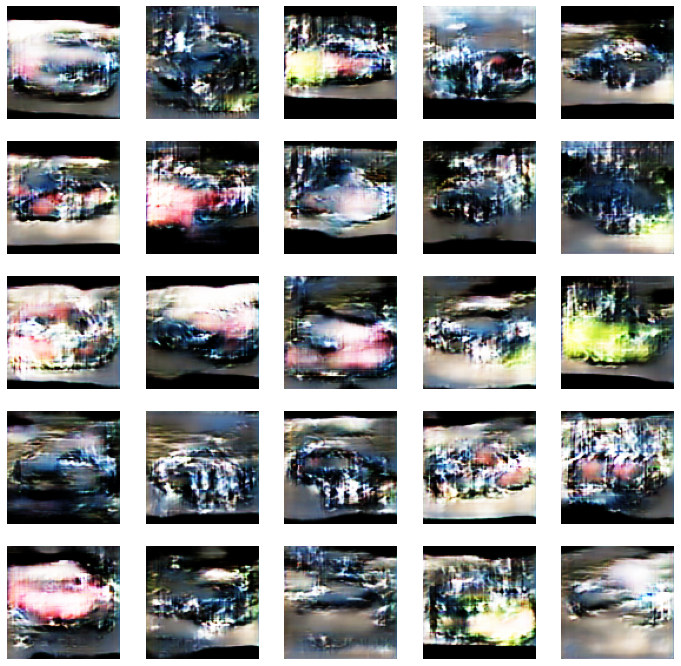

Epoch: 200


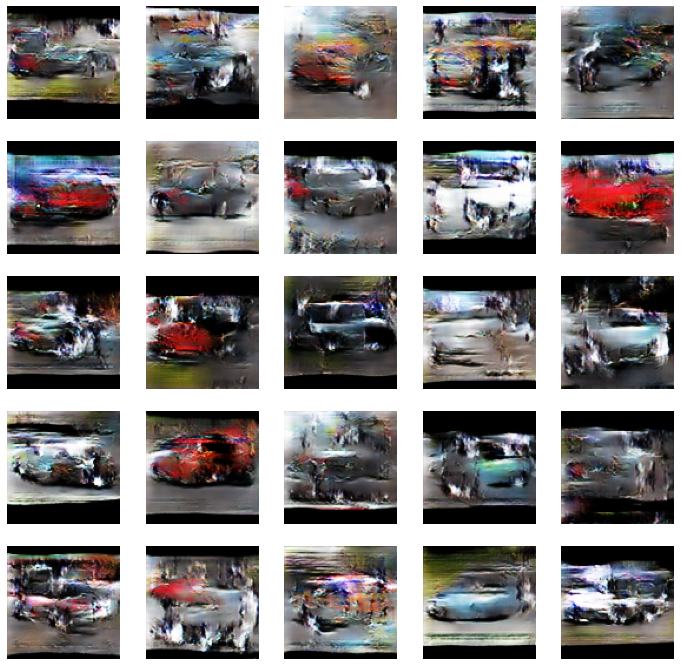

Epoch: 300


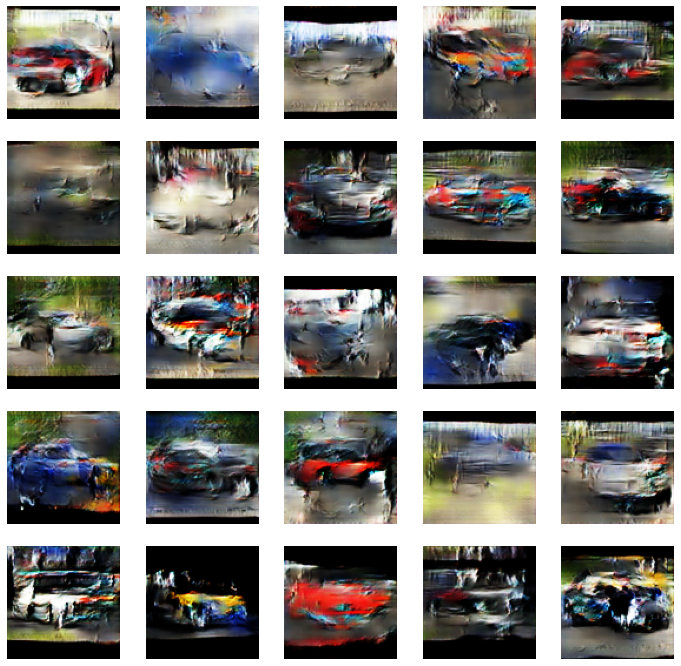

Epoch: 400


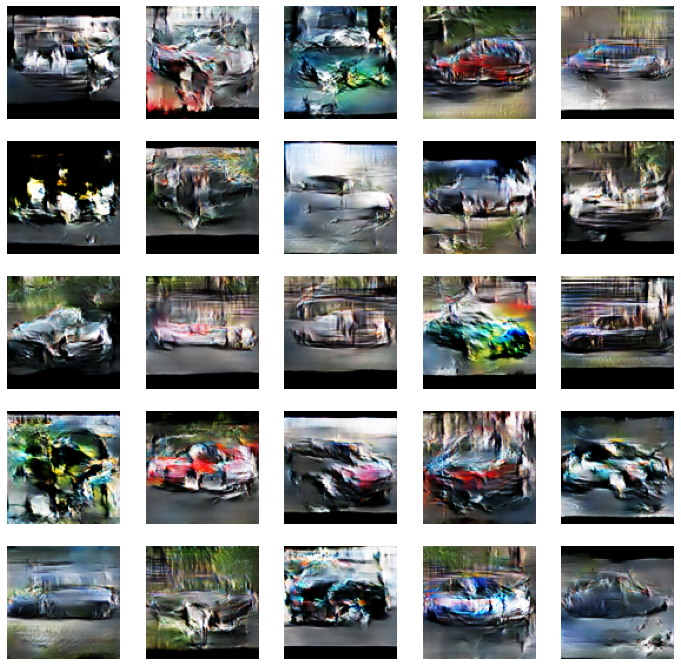

Epoch: 500


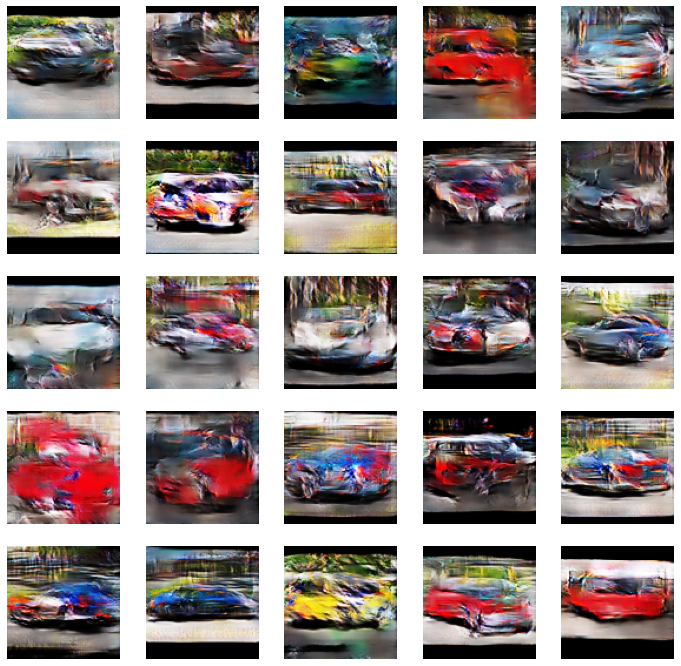

Epoch: 600


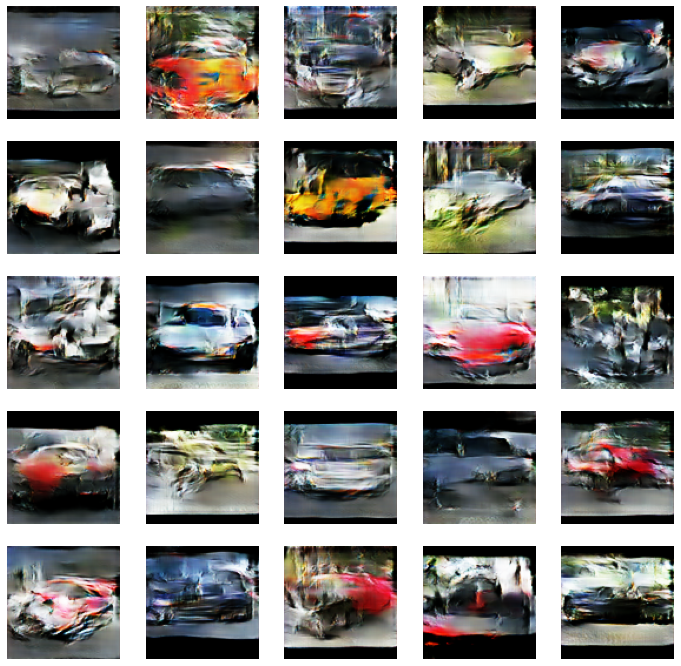

Epoch: 700


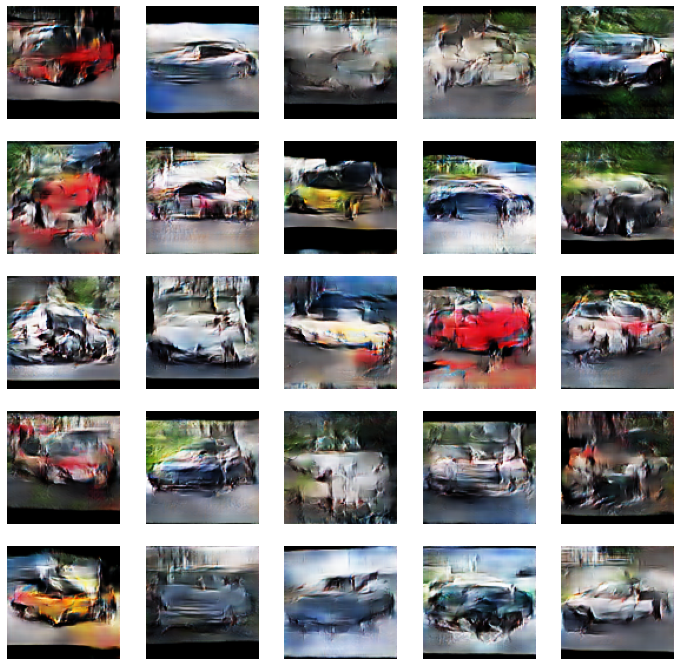

Epoch: 800


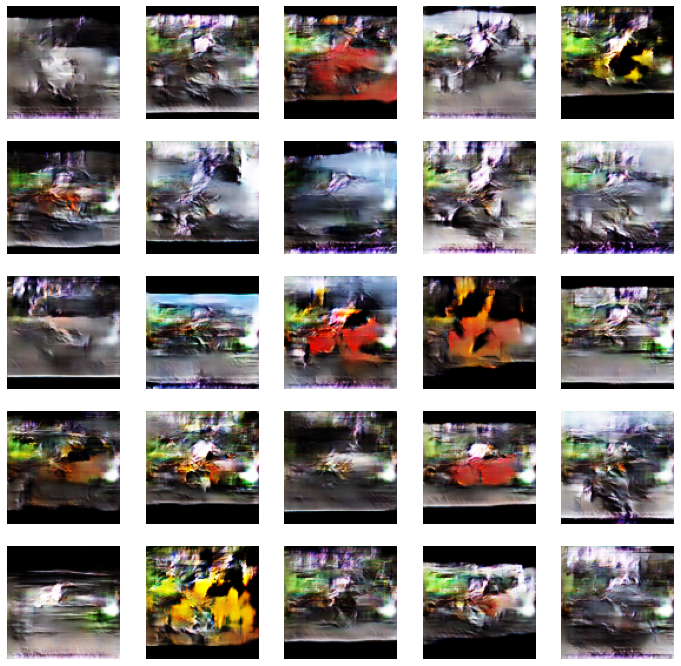

Epoch: 900


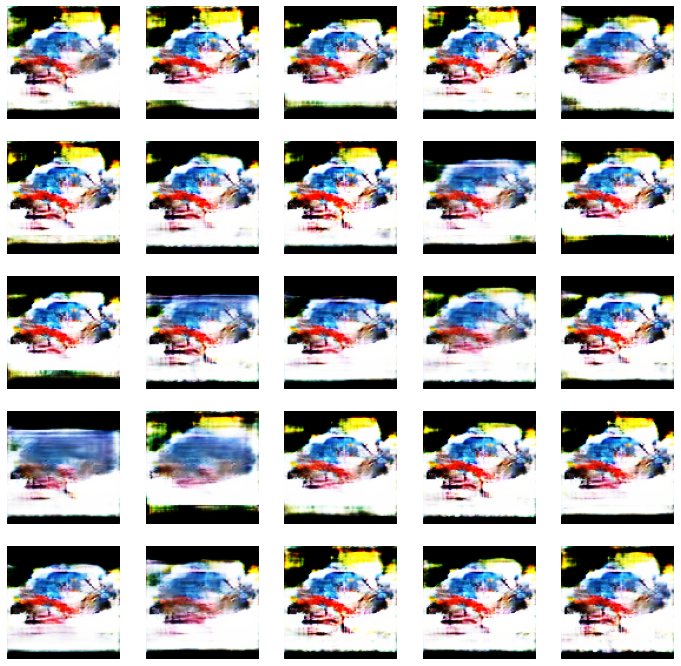

Epoch: 1000


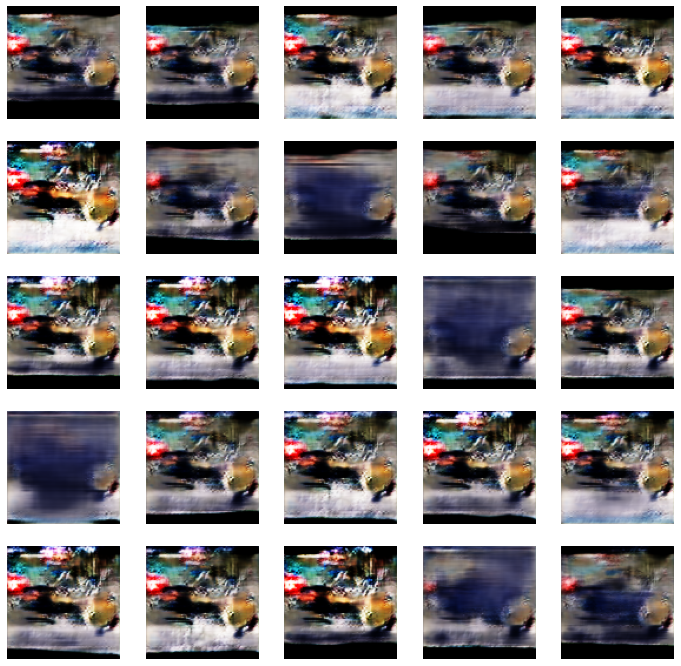

Epoch: 1100


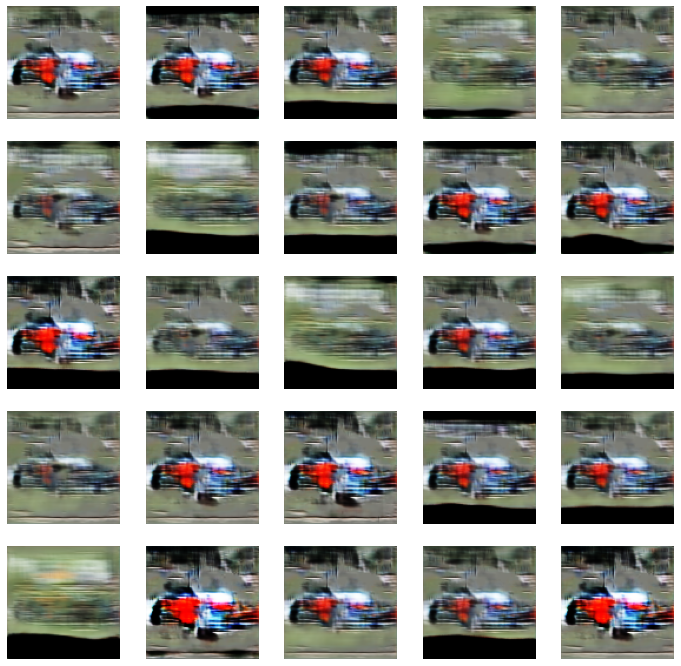

Epoch: 1200


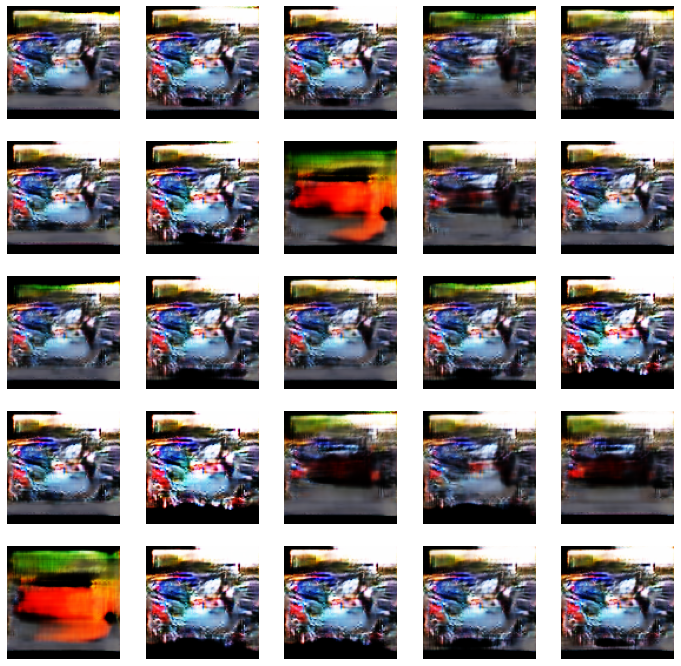

Epoch: 1300


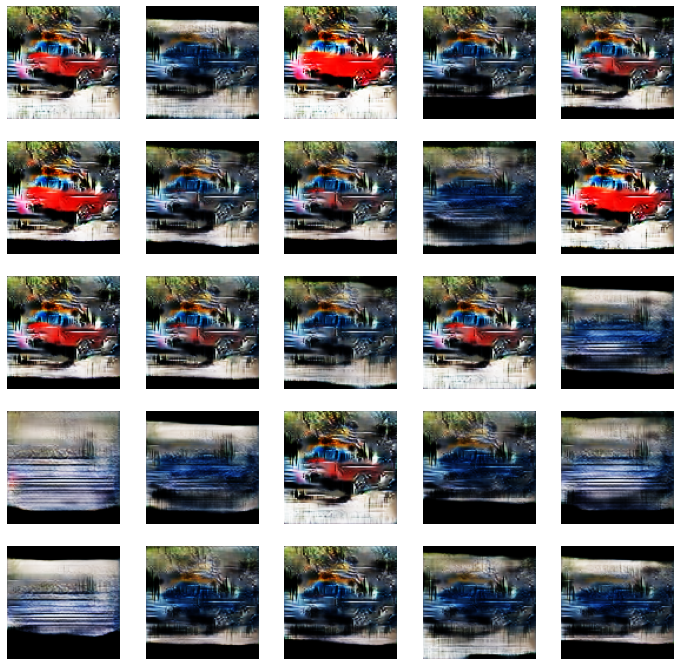

Epoch: 1400


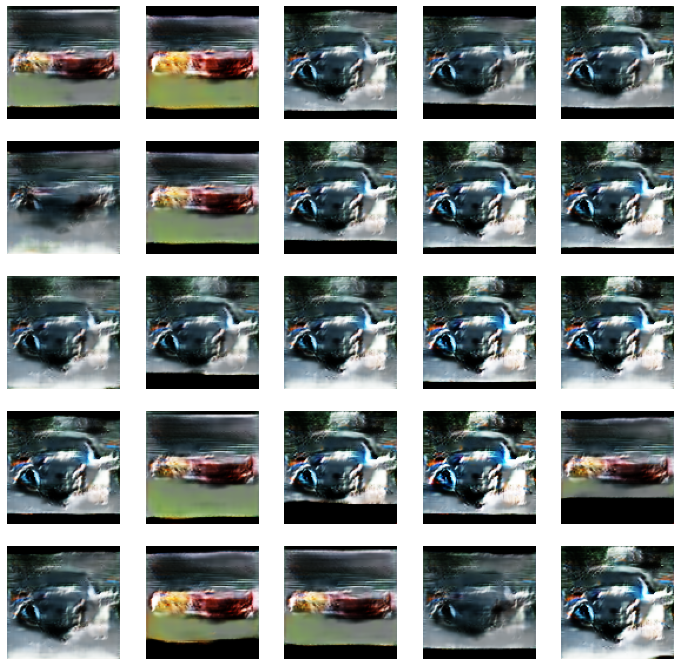

Epoch: 1500


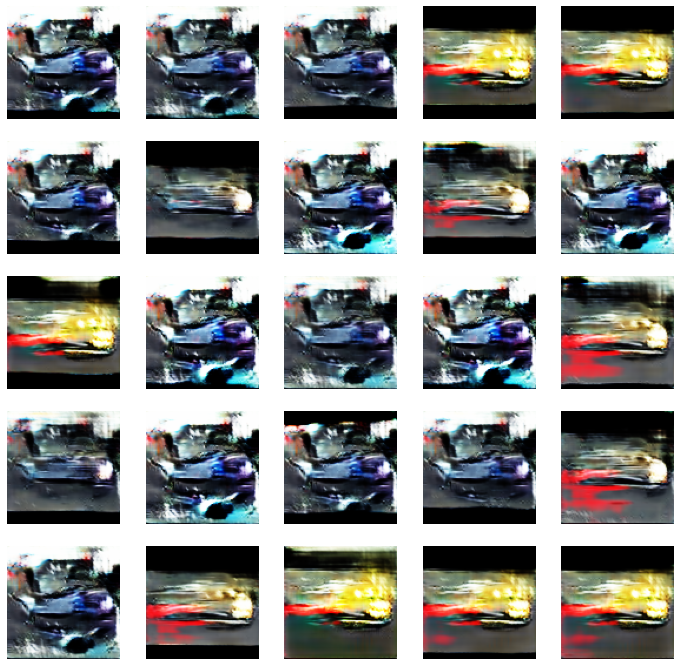

In [16]:
for epoch in range(num_epochs):
    for images in batched_data:
        # Sampling noise and generating a batch of new images
        noise = np.random.normal(0, 1, (batch_size, latent_dimensions))
        generated_images = generator.predict(noise)

        # Training the discriminator
        discriminator.train_on_batch(images, real)
        discriminator.train_on_batch(generated_images, fake)

        # Training the generator
        combined_network.train_on_batch(noise, real)

    if (epoch + 1) % display_interval == 0:
        print(f'Epoch: {epoch + 1}')
        display_images()